In [ ]:
# Run this cell to mount your Google Drive.

from IPython.display import clear_output, Image
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


# Imports

In [ ]:
# !pip install rlcard
!pip install rlcard[torch]
!pip install rlcard[tensorflow]

clear_output()

In [ ]:
import torch
import numpy as np
import tensorflow
import os
import importlib

# path
pth = '/content/drive/MyDrive/Colab Notebooks/Thesis'

%cd /content/drive/My Drive/Colab Notebooks/Thesis/SupervisedLearning

from MLP import *
from models import *

# remove pycache
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/agents/
%rm -r __pycache__
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/envs/
%rm -r __pycache__
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/games/
%rm -r __pycache__
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/utils/
%rm -r __pycache__
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/
%rm -r __pycache__

%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn

try:
    importlib.reload(rlcard)
    importlib.reload(rlcard.utils)
    importlib.reload(rlcard.agents.random_agent)
    importlib.reload(rlcard.agents.dqn_agent_pytorch)
    importlib.reload(rlcard.agents.simpleGinRummy_agent)
    importlib.reload(rlcard.games.gin_rummy.utils.scorers)
except:
    pass

import rlcard
from rlcard.utils import set_global_seed, tournament, tournament2, tournament3
from rlcard.utils import Logger
from rlcard.agents.random_agent import RandomAgent
from rlcard.agents.dqn_agent_pytorch import DQNAgent
from rlcard.agents.simpleGinRummy_agent import SimpleGinRummyAgent

# different versions of payoff functions
from rlcard.games.gin_rummy.utils.scorers import *

%cd /content/drive/My Drive/Colab Notebooks/Thesis

clear_output()

In [ ]:
def load_checkpoint(checkpoint):
    # load DQN pretrained weights using built in load function
    if isDQN:
        agent.load(checkpoint)
        agent2.load(checkpoint)
    else:
        model_dict = checkpoint.state_dict()
        # Generate pretrained dictionary of weights/biases
        pretrained_dict = {}

        # check if there is batch norm layer
        if batch_norm:
            b_layer = 1 
            pretrained_dict['fc_layers.1.weight'] = agent.q_estimator.qnet.fc_layers[1].weight
            pretrained_dict['fc_layers.1.bias'] = agent.q_estimator.qnet.fc_layers[1].bias
            pretrained_dict['fc_layers.1.running_mean'] = agent.q_estimator.qnet.fc_layers[1].running_mean
            pretrained_dict['fc_layers.1.running_var'] = agent.q_estimator.qnet.fc_layers[1].running_var
            pretrained_dict['fc_layers.1.num_batches_tracked'] = agent.q_estimator.qnet.fc_layers[1].num_batches_tracked
        else:
            b_layer = 0
        curr_layer = b_layer + 1
        for i in range(len(mlp_layers)):
            pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = model_dict['l{}.weight'.format(i+1)]
            pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = model_dict['l{}.bias'.format(i+1)]
            curr_layer += 2
        # check if there is a top_layer
        if top_layer:
            # check if copy top layer weights
            if copy_top:
                pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = torch.tensor(np.eye(110), device=device)
                pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = torch.tensor(np.zeros(110), device=device)
            else:
                pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = agent.target_estimator.qnet.fc_layers[curr_layer].weight
                pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = agent.target_estimator.qnet.fc_layers[curr_layer].bias
            curr_layer += 2

        # check if extra layer for knocking
        if knock_layer:
            pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = torch.tensor(np.eye(110), device=device)
            knock_probs = np.ones(110)*knock_val
            knock_probs[0:58] = 0
            pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = torch.tensor(knock_probs, device=device)
        
        # load pretrained weights
        agent.q_estimator.qnet.load_state_dict(pretrained_dict)
        agent.target_estimator.qnet.load_state_dict(pretrained_dict)
    
    # check if freeze layers (DO NOT FREEZE TOP LAYER)
    curr_layer = 1
    if freeze_layers:
        if batch_norm:
            agent.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
            agent.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
            agent.target_estimator.qnet.fc_layers[1].weight.requires_grad = False
            agent.target_estimator.qnet.fc_layers[1].bias.requires_grad = False
        curr_layer += b_layer
        for i in range(len(mlp_layers)):
            agent.q_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = False
            agent.q_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = False
            agent.target_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = False
            agent.target_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = False
            curr_layer += 2
        if top_layer:
            # there is additional top layer, do not freeze 
            pass
        else:
            # no additional top layer, unfreeze top layer 
            curr_layer -= 2
        # unfreeze top layers
        agent.q_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = True
        agent.q_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = True
        agent.target_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = True
        agent.target_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = True
        curr_layer += 2
        # check if extra layer for knocking
        if knock_layer:
            agent.q_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = False
            agent.q_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = False
            agent.target_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = False
            agent.target_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = False

# Top Layer Testing on Selfplay

In [ ]:
dir = 'topLayer_self'    # root directory name for group of models

## base

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.0002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.
  Gin: 6 | Knock: 92 | Other: 2
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  161197
  reward       |  0.01850000000000002
  Avg Turns    |  16.77
  Cond_Knock   |  0.6144578313253012
  Gin: 2 | Knock: 51 | Other: 47
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  161197
  reward       |  -0.03369999999999995
  Avg Turns    |  15.29
  Cond_Knock   |  0.5633802816901409
  Gin: 2 | Knock: 40 | Other: 58
----------------------------------------
INFO - Agent dqn, step 82300, rl-loss: 0.0459870845079422
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  164788
  reward       |  0.20879999999999968
  Avg Turns    |  21.17
  Cond_Knock   |  0.5647058823529412
  Gin: 2 | Knock: 96 | Other: 2
-------------------------------------

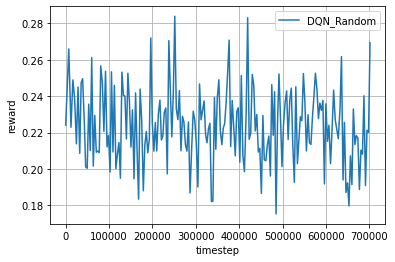

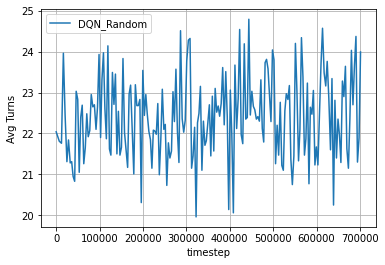

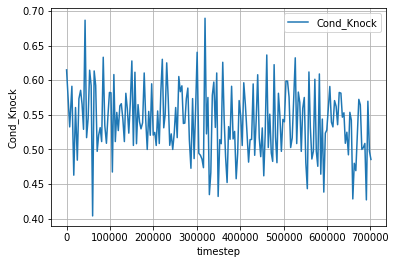

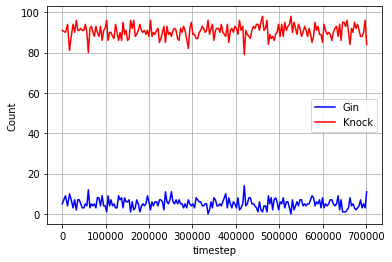

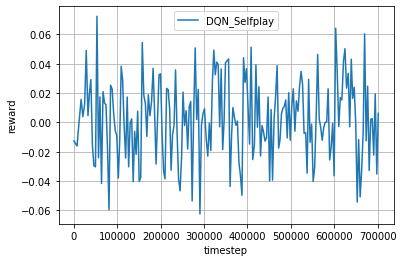

...

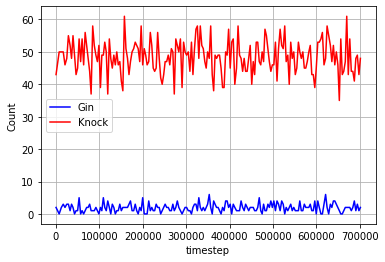

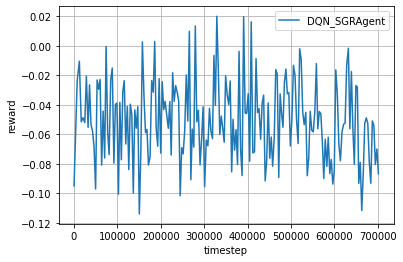

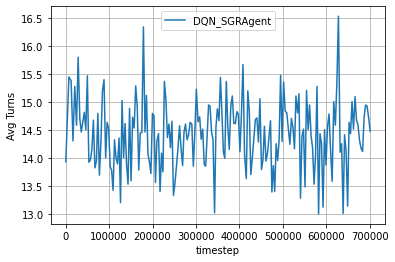

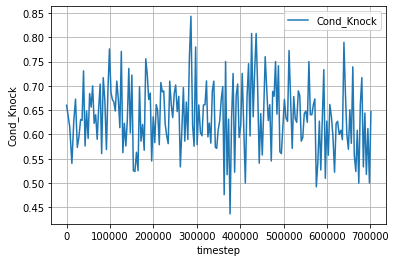

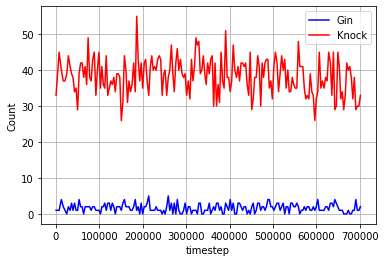

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 4, 'Knock': 94, 'Other': 2, 'Knock_Possible': 146, 'Avg Turns': 22.53}


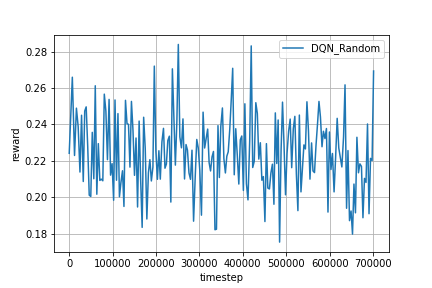

In [ ]:
Image(log_dir + '/rand_fig.png')

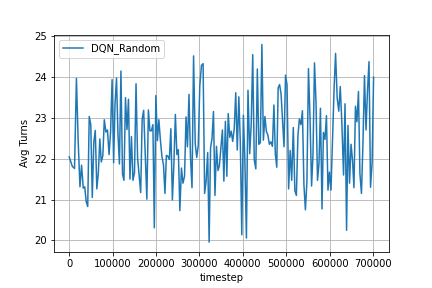

In [ ]:
Image(log_dir + '/rand_fig2.png')

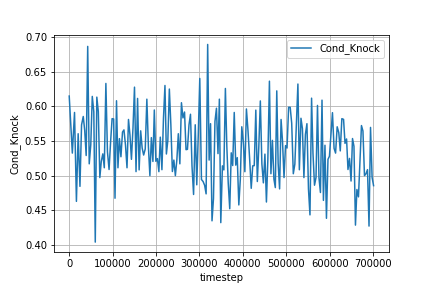

In [ ]:
Image(log_dir + '/rand_fig3.png')

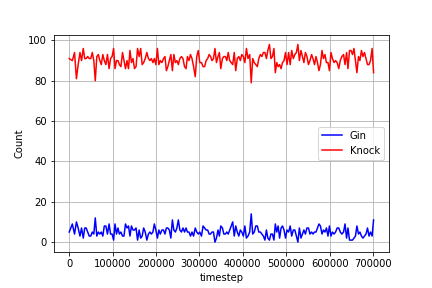

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 42, 'Other': 58, 'Knock_Possible': 75, 'Avg Turns': 15.98}


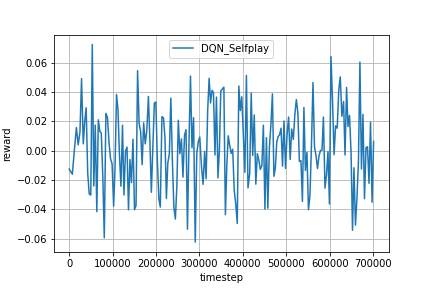

In [ ]:
Image(log_dir + '/self_fig.png')

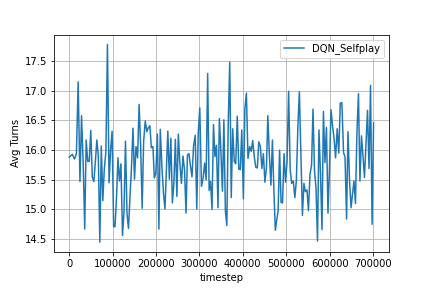

In [ ]:
Image(log_dir + '/self_fig2.png')

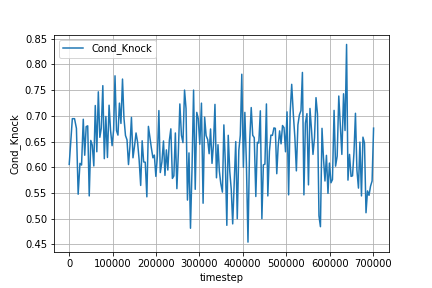

In [ ]:
Image(log_dir + '/self_fig3.png')

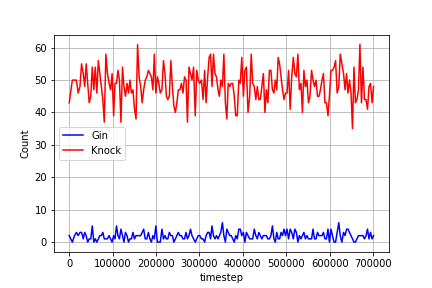

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 36, 'Other': 64, 'Knock_Possible': 51, 'Avg Turns': 15.72}


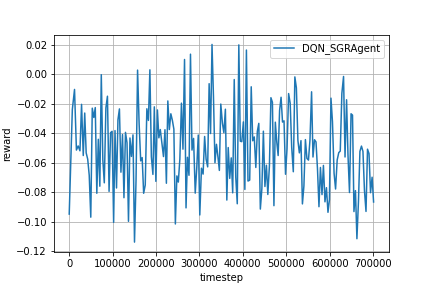

In [ ]:
Image(log_dir + '/sgr_fig.png')

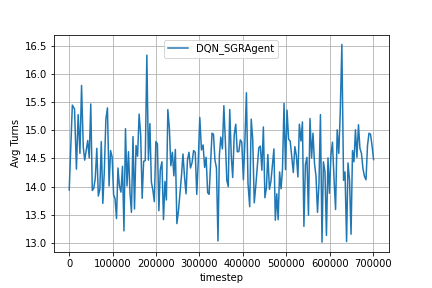

In [ ]:
Image(log_dir + '/sgr_fig2.png')

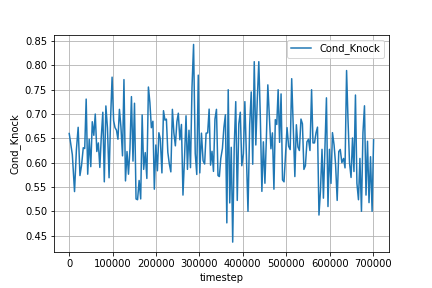

In [ ]:
Image(log_dir + '/sgr_fig3.png')

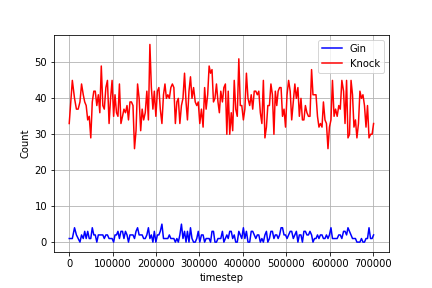

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## base_unfrozen

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base_unfrozen'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = False

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.0002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.
  Gin: 4 | Knock: 87 | Other: 9
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  161795
  reward       |  0.03090000000000005
  Avg Turns    |  17.56
  Cond_Knock   |  0.4909090909090909
  Gin: 2 | Knock: 54 | Other: 44
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  161795
  reward       |  -0.09539999999999997
  Avg Turns    |  14.91
  Cond_Knock   |  0.410958904109589
  Gin: 0 | Knock: 30 | Other: 70
----------------------------------------
INFO - Agent dqn, step 82600, rl-loss: 0.03307807445526123
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  165432
  reward       |  0.25009999999999966
  Avg Turns    |  23.61
  Cond_Knock   |  0.5120481927710844
  Gin: 9 | Knock: 85 | Other: 6
-------------------------------------

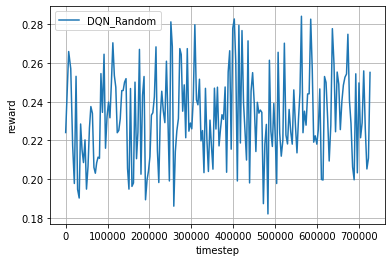

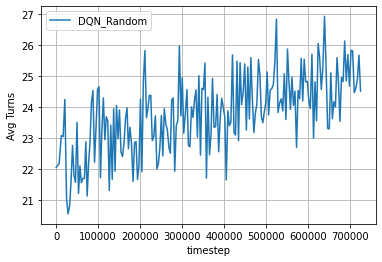

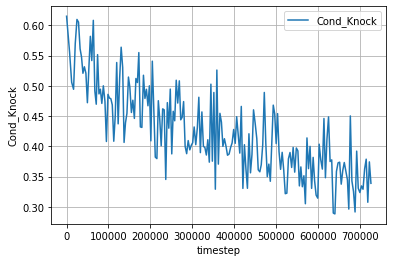

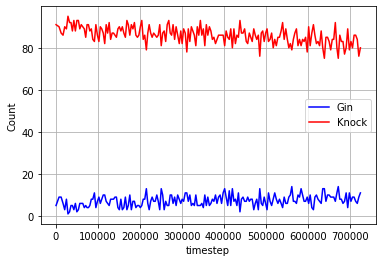

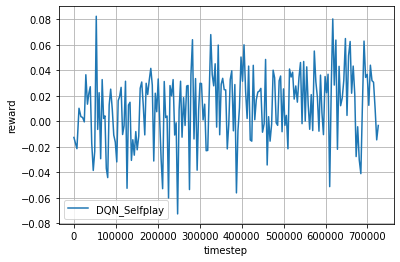

...

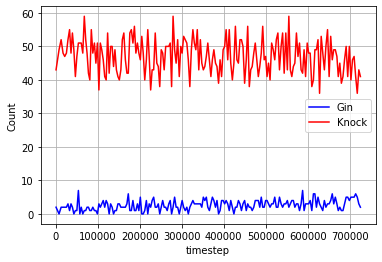

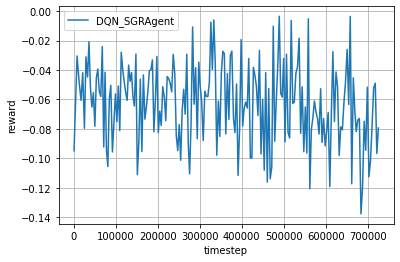

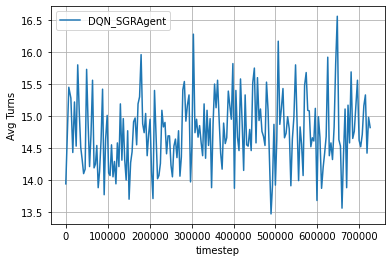

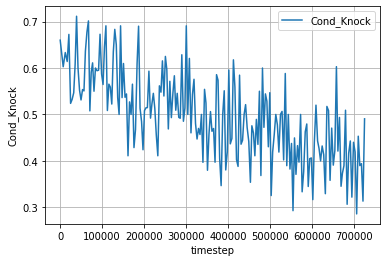

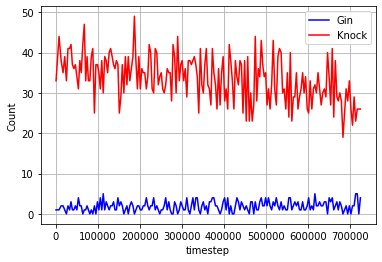

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 10, 'Knock': 86, 'Other': 4, 'Knock_Possible': 255, 'Avg Turns': 26.59}


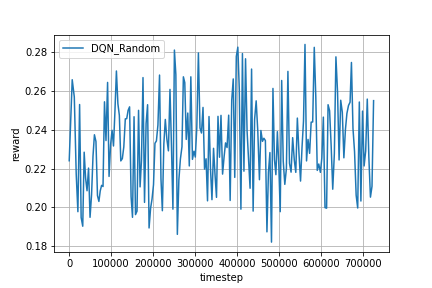

In [ ]:
Image(log_dir + '/rand_fig.png')

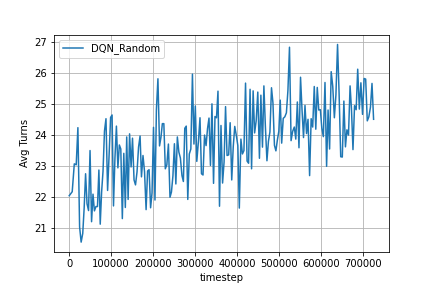

In [ ]:
Image(log_dir + '/rand_fig2.png')

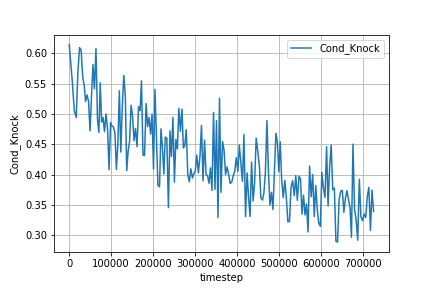

In [ ]:
Image(log_dir + '/rand_fig3.png')

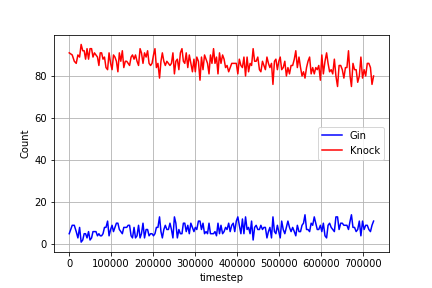

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 5, 'Knock': 36, 'Other': 59, 'Knock_Possible': 110, 'Avg Turns': 18.16}


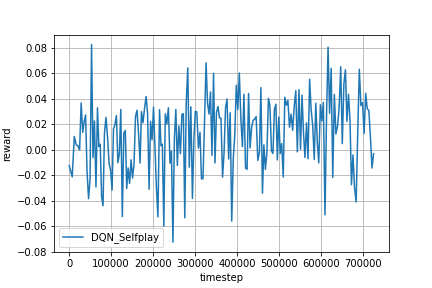

In [ ]:
Image(log_dir + '/self_fig.png')

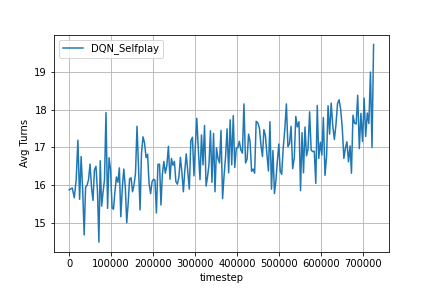

In [ ]:
Image(log_dir + '/self_fig2.png')

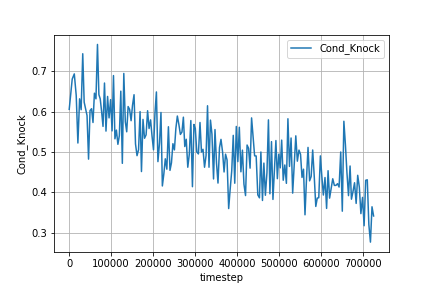

In [ ]:
Image(log_dir + '/self_fig3.png')

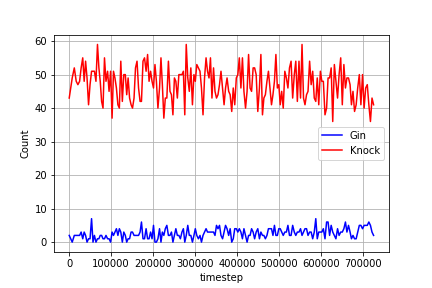

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 27, 'Other': 73, 'Knock_Possible': 57, 'Avg Turns': 15.38}


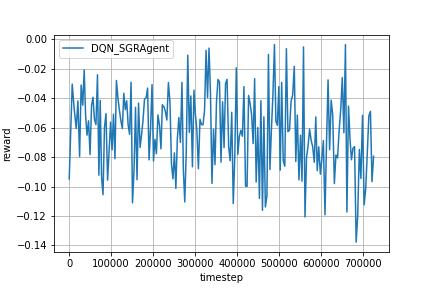

In [ ]:
Image(log_dir + '/sgr_fig.png')

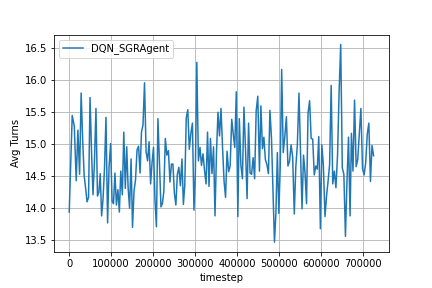

In [ ]:
Image(log_dir + '/sgr_fig2.png')

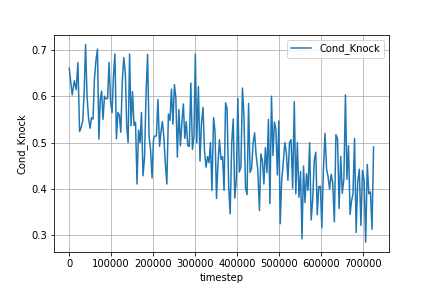

In [ ]:
Image(log_dir + '/sgr_fig3.png')

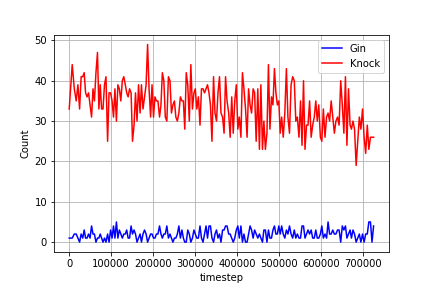

In [ ]:
Image(log_dir + '/sgr_fig4.png')

# Top Layer Testing on Selfplay - Knock Layer

In [ ]:
dir = 'topLayer_self'    # root directory name for group of models

## base + Knock Layer (0.002)

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base_knock_point002'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.
  Gin: 6 | Knock: 88 | Other: 6
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  160646
  reward       |  0.021199999999999993
  Avg Turns    |  16.59
  Cond_Knock   |  0.6296296296296297
  Gin: 2 | Knock: 51 | Other: 47
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  160646
  reward       |  -0.05359999999999995
  Avg Turns    |  14.39
  Cond_Knock   |  0.5571428571428572
  Gin: 1 | Knock: 39 | Other: 60
----------------------------------------
INFO - Agent dqn, step 82100, rl-loss: 0.0005982542061246932
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  164301
  reward       |  0.22179999999999964
  Avg Turns    |  20.55
  Cond_Knock   |  0.5375722543352601
  Gin: 4 | Knock: 93 | Other: 3
---------------------------------

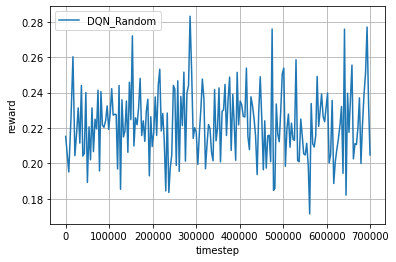

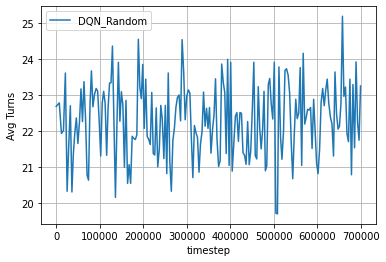

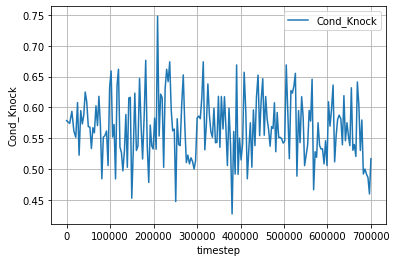

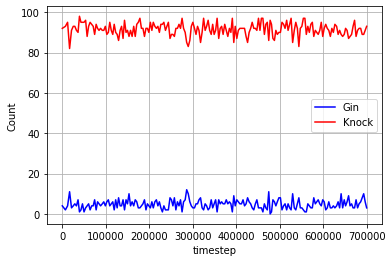

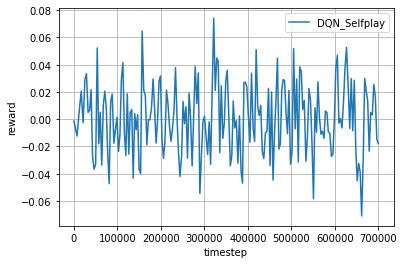

...

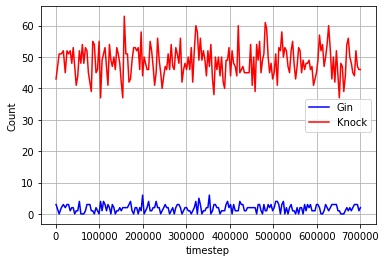

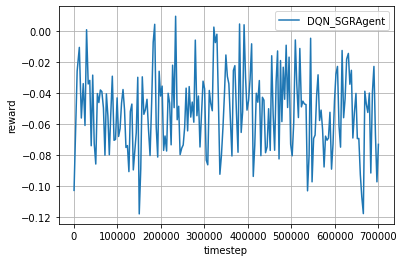

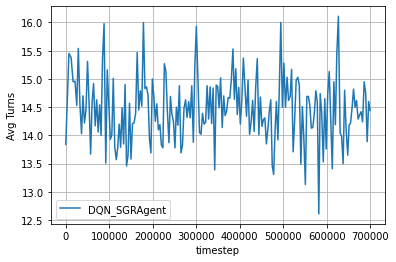

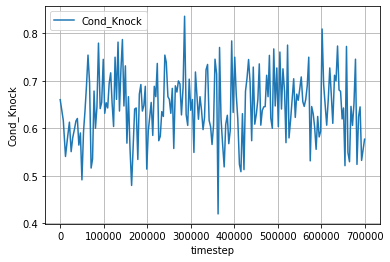

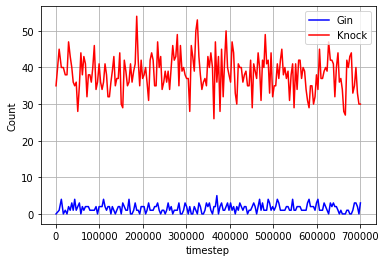

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 7, 'Knock': 91, 'Other': 2, 'Knock_Possible': 165, 'Avg Turns': 22.7}


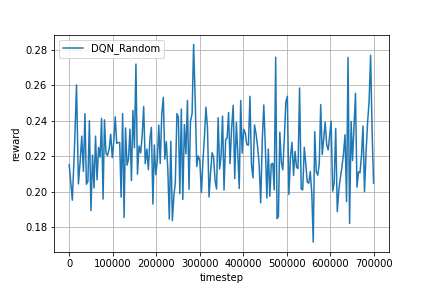

In [ ]:
Image(log_dir + '/rand_fig.png')

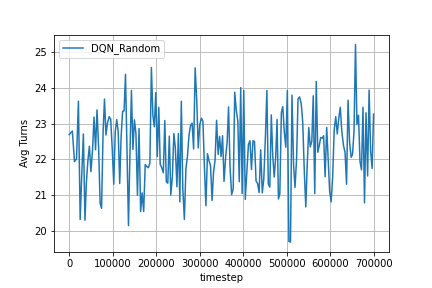

In [ ]:
Image(log_dir + '/rand_fig2.png')

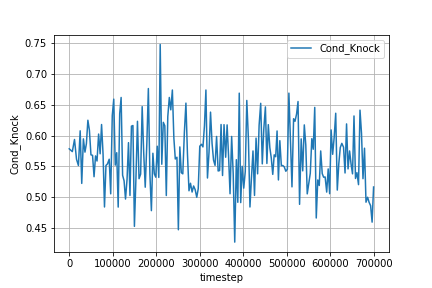

In [ ]:
Image(log_dir + '/rand_fig3.png')

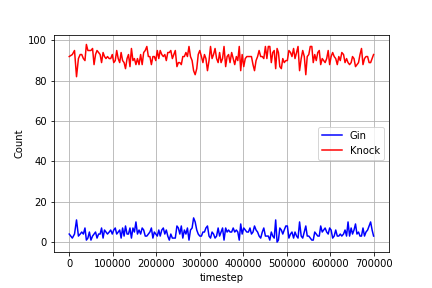

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 41, 'Other': 59, 'Knock_Possible': 68, 'Avg Turns': 16.51}


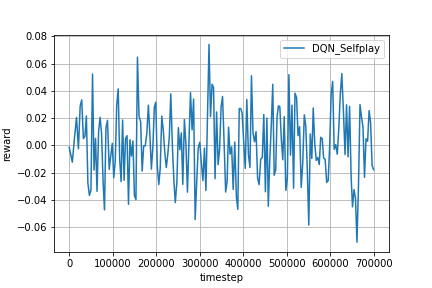

In [ ]:
Image(log_dir + '/self_fig.png')

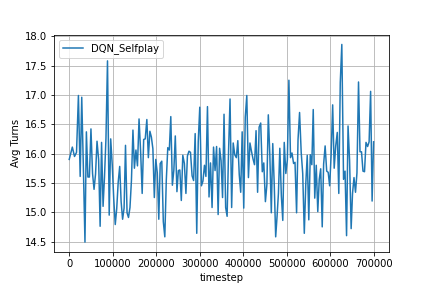

In [ ]:
Image(log_dir + '/self_fig2.png')

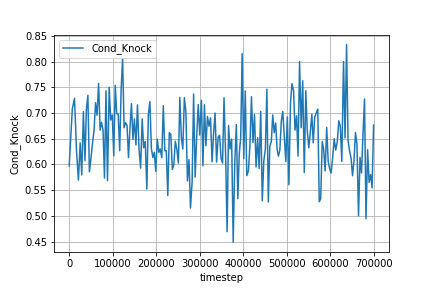

In [ ]:
Image(log_dir + '/self_fig3.png')

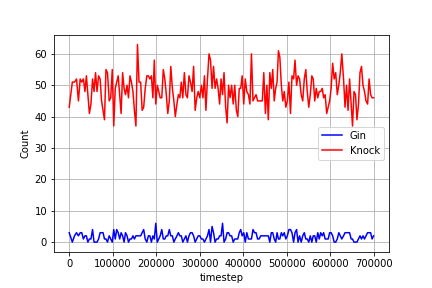

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 34, 'Other': 66, 'Knock_Possible': 54, 'Avg Turns': 15.46}


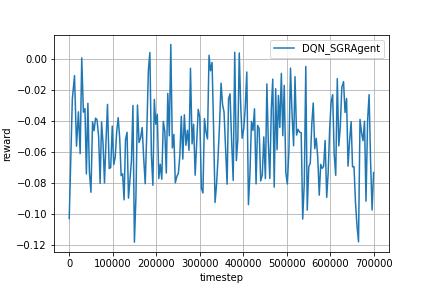

In [ ]:
Image(log_dir + '/sgr_fig.png')

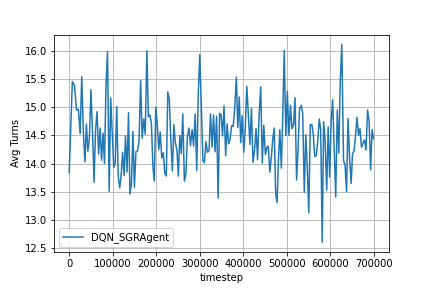

In [ ]:
Image(log_dir + '/sgr_fig2.png')

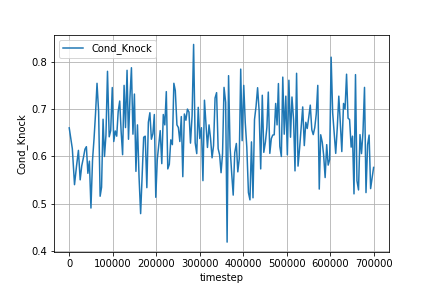

In [ ]:
Image(log_dir + '/sgr_fig3.png')

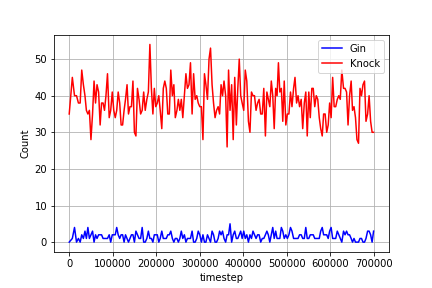

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## base + Knock Layer (0.02)

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base_knock_point02'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 0.02

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.
  Gin: 7 | Knock: 92 | Other: 1
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  160070
  reward       |  0.0236
  Avg Turns    |  16.63
  Cond_Knock   |  0.6419753086419753
  Gin: 2 | Knock: 52 | Other: 46
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  160070
  reward       |  -0.05539999999999993
  Avg Turns    |  15.39
  Cond_Knock   |  0.5
  Gin: 0 | Knock: 39 | Other: 61
----------------------------------------
INFO - Agent dqn, step 81800, rl-loss: 0.003460874781012535
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  163709
  reward       |  0.2148999999999997
  Avg Turns    |  21.23
  Cond_Knock   |  0.5733333333333334
  Gin: 6 | Knock: 86 | Other: 8
----------------------------------------

Selfplay:

-----------

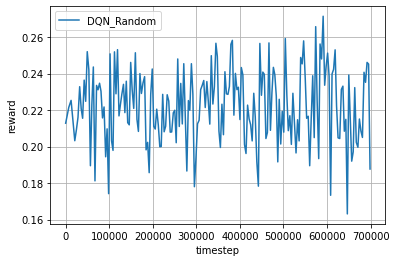

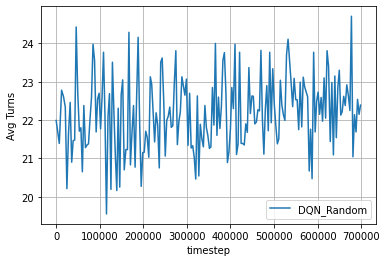

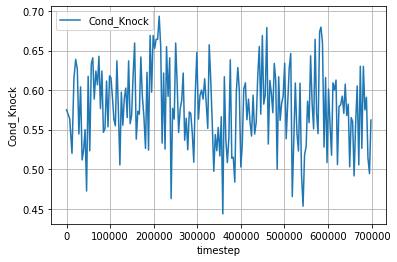

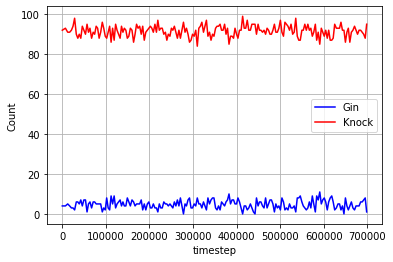

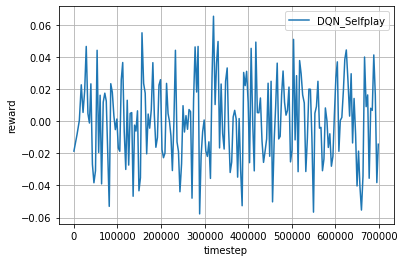

...

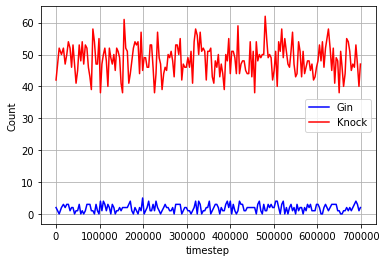

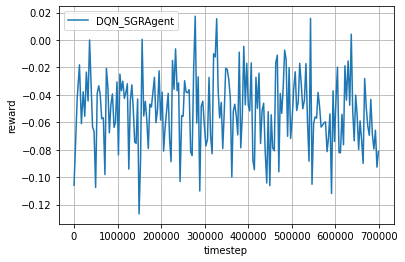

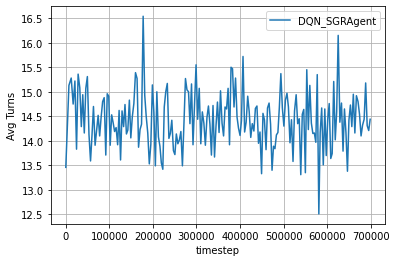

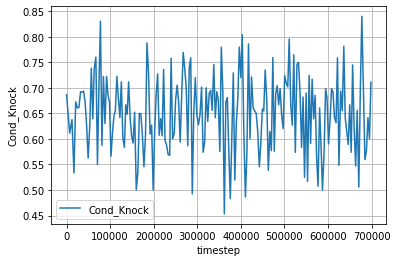

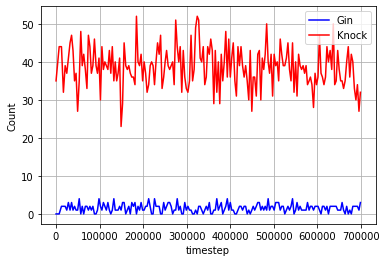

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 3, 'Knock': 95, 'Other': 2, 'Knock_Possible': 163, 'Avg Turns': 23.27}


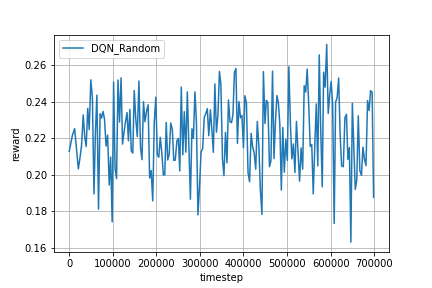

In [ ]:
Image(log_dir + '/rand_fig.png')

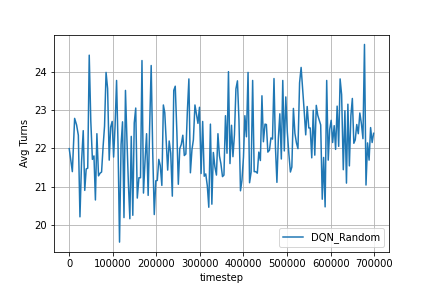

In [ ]:
Image(log_dir + '/rand_fig2.png')

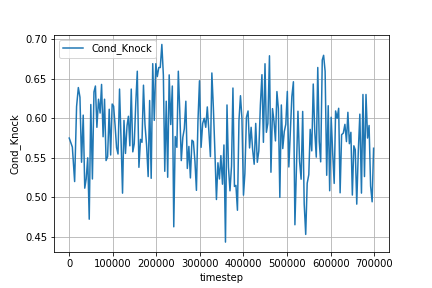

In [ ]:
Image(log_dir + '/rand_fig3.png')

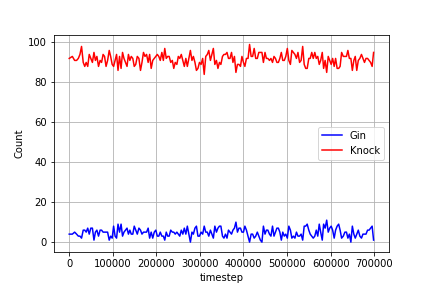

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 41, 'Other': 59, 'Knock_Possible': 68, 'Avg Turns': 16.23}


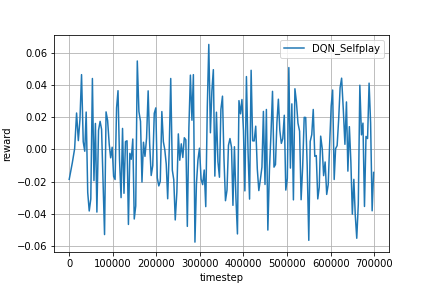

In [ ]:
Image(log_dir + '/self_fig.png')

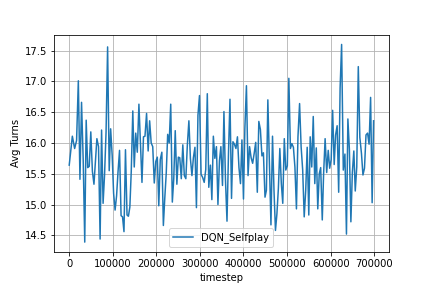

In [ ]:
Image(log_dir + '/self_fig2.png')

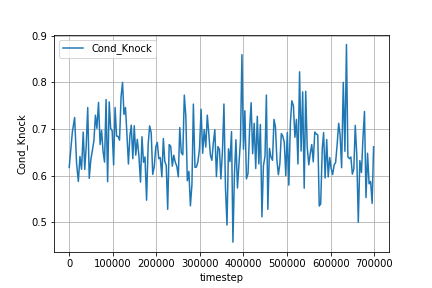

In [ ]:
Image(log_dir + '/self_fig3.png')

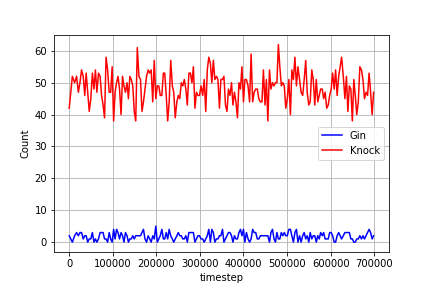

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 38, 'Other': 62, 'Knock_Possible': 57, 'Avg Turns': 15.5}


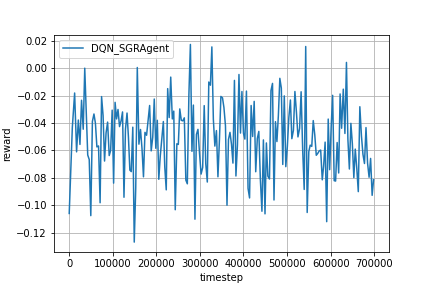

In [ ]:
Image(log_dir + '/sgr_fig.png')

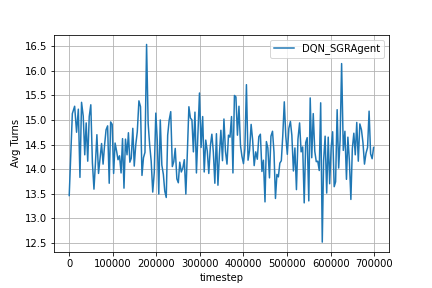

In [ ]:
Image(log_dir + '/sgr_fig2.png')

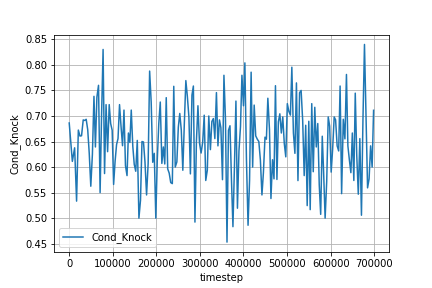

In [ ]:
Image(log_dir + '/sgr_fig3.png')

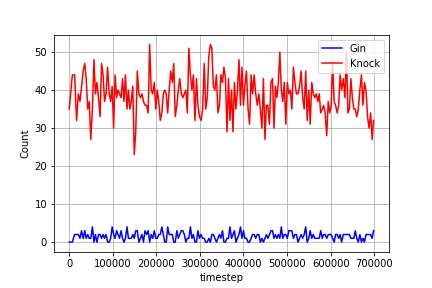

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## base + Knock Layer (0.2)

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base_knock_point2'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 0.2

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.
  Gin: 2 | Knock: 96 | Other: 2
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  160636
  reward       |  0.006499999999999997
  Avg Turns    |  16.45
  Cond_Knock   |  0.631578947368421
  Gin: 2 | Knock: 48 | Other: 50
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  160636
  reward       |  -0.05309999999999995
  Avg Turns    |  14.91
  Cond_Knock   |  0.6774193548387096
  Gin: 0 | Knock: 42 | Other: 58
----------------------------------------
INFO - Agent dqn, step 82000, rl-loss: 0.0041634701192379
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  164247
  reward       |  0.20039999999999972
  Avg Turns    |  20.47
  Cond_Knock   |  0.6546762589928058
  Gin: 3 | Knock: 91 | Other: 6
-------------------------------------

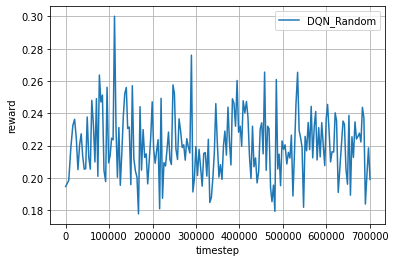

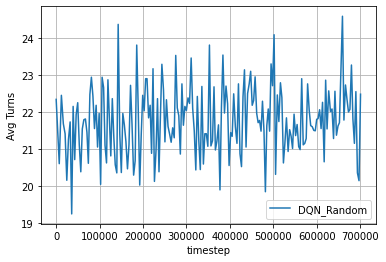

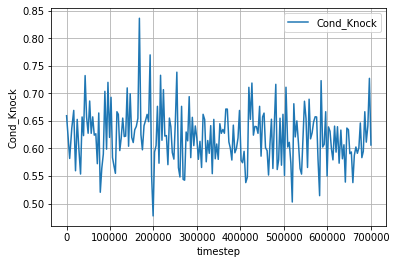

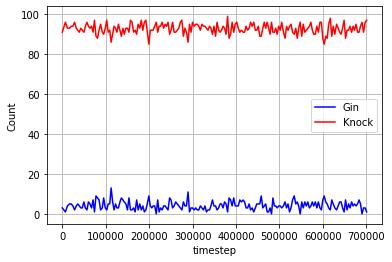

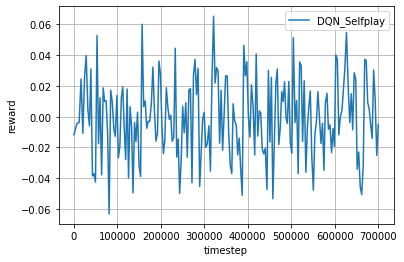

...

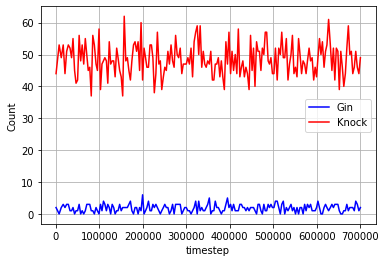

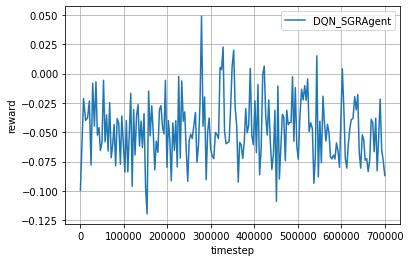

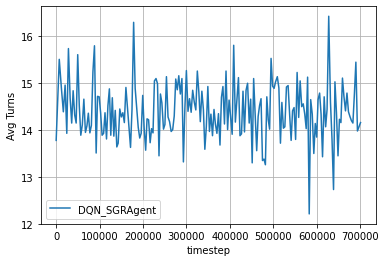

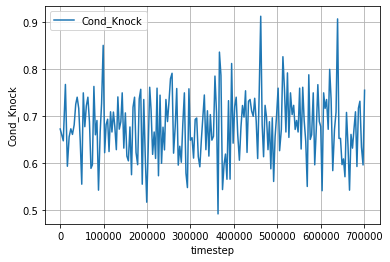

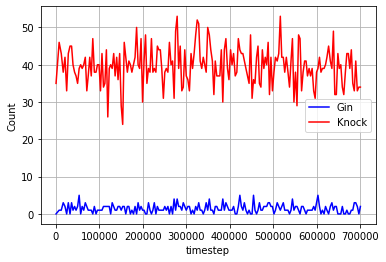

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 4, 'Knock': 91, 'Other': 5, 'Knock_Possible': 158, 'Avg Turns': 23.23}


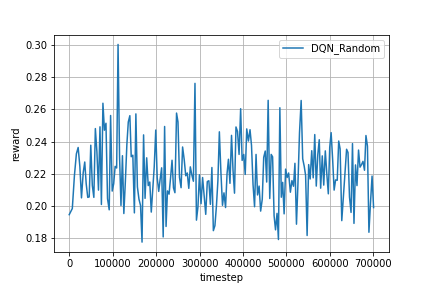

In [ ]:
Image(log_dir + '/rand_fig.png')

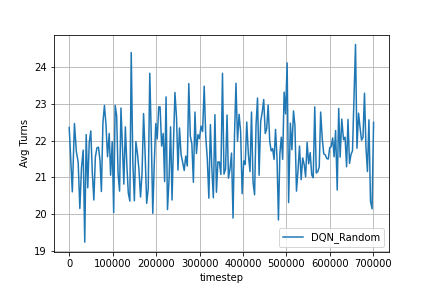

In [ ]:
Image(log_dir + '/rand_fig2.png')

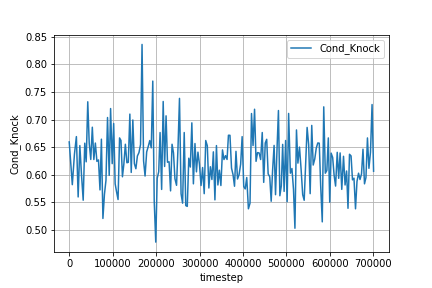

In [ ]:
Image(log_dir + '/rand_fig3.png')

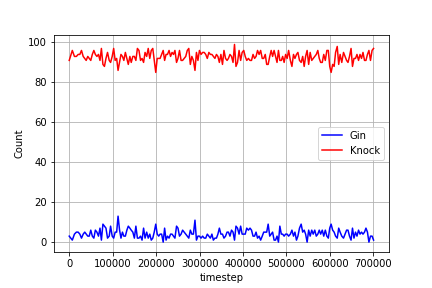

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 42, 'Other': 58, 'Knock_Possible': 69, 'Avg Turns': 16.04}


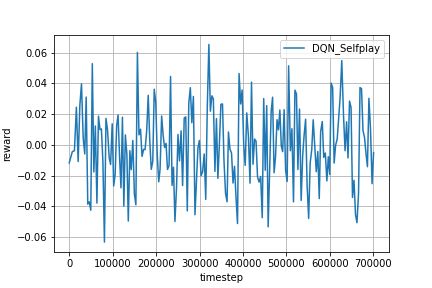

In [ ]:
Image(log_dir + '/self_fig.png')

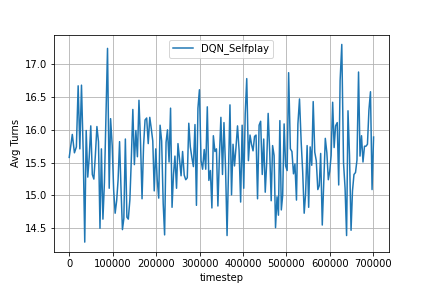

In [ ]:
Image(log_dir + '/self_fig2.png')

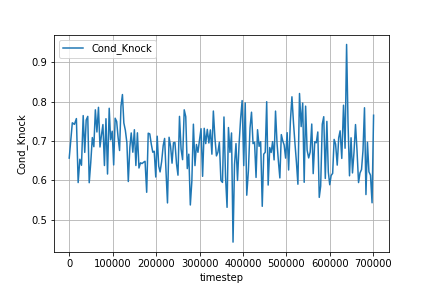

In [ ]:
Image(log_dir + '/self_fig3.png')

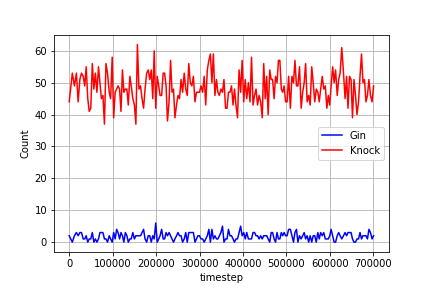

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 27, 'Other': 72, 'Knock_Possible': 48, 'Avg Turns': 15.41}


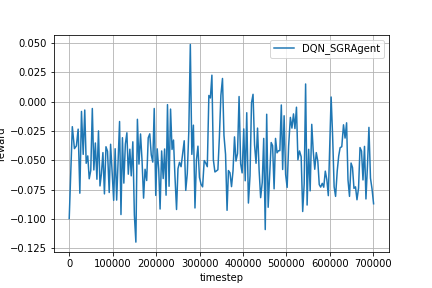

In [ ]:
Image(log_dir + '/sgr_fig.png')

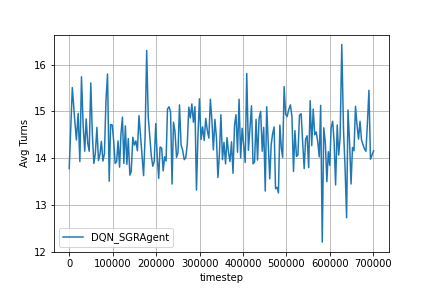

In [ ]:
Image(log_dir + '/sgr_fig2.png')

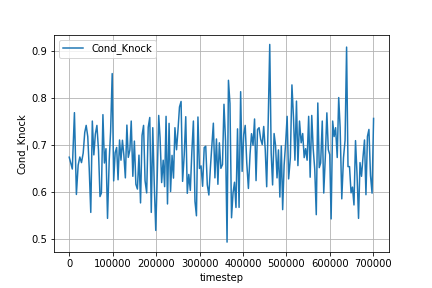

In [ ]:
Image(log_dir + '/sgr_fig3.png')

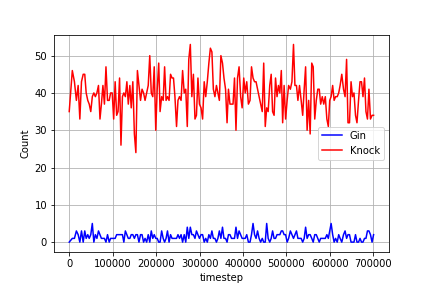

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## base + Knock Layer (2)

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base_knock_2'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 2

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.

SGRAgent:

----------------------------------------
  timestep     |  507333
  reward       |  -0.03049999999999995
  Avg Turns    |  14.47
  Cond_Knock   |  1.0
  Gin: 0 | Knock: 48 | Other: 52
----------------------------------------
INFO - Agent dqn, step 259400, rl-loss: 0.007711334154009819
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  518874
  reward       |  0.23199999999999965
  Avg Turns    |  19.71
  Cond_Knock   |  1.0
  Gin: 4 | Knock: 96 | Other: 0
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  518874
  reward       |  -0.022399999999999986
  Avg Turns    |  14.36
  Cond_Knock   |  1.0
  Gin: 0 | Knock: 48 | Other: 52
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  518874
  reward       |  -0.0500999999

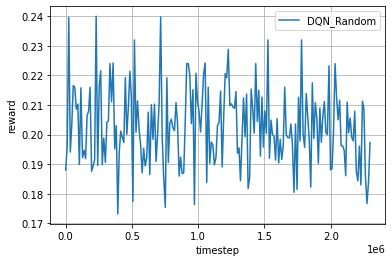

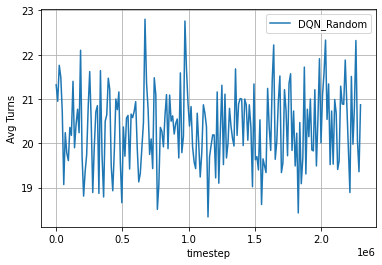

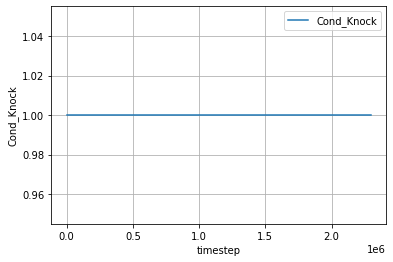

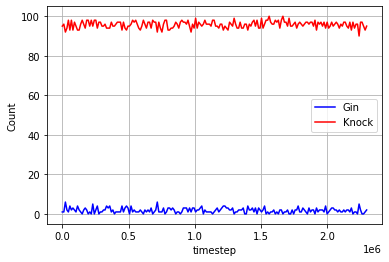

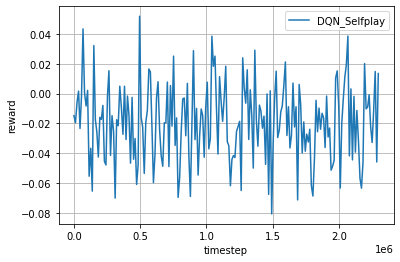

...

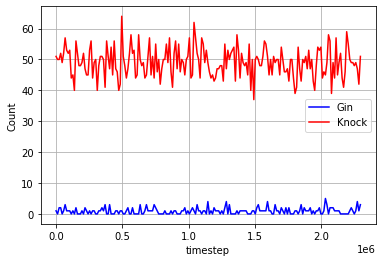

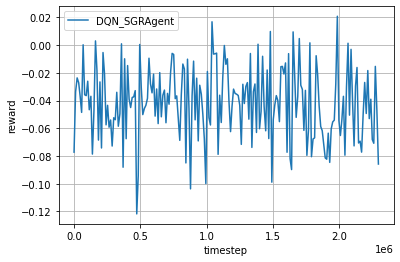

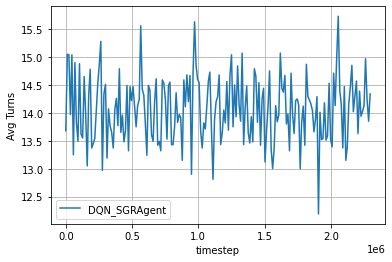

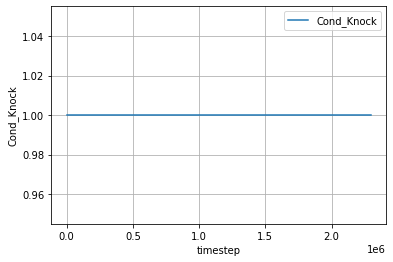

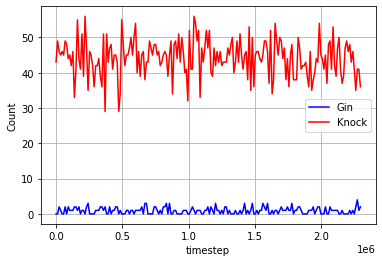

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 98, 'Other': 2, 'Knock_Possible': 98, 'Avg Turns': 22.07}


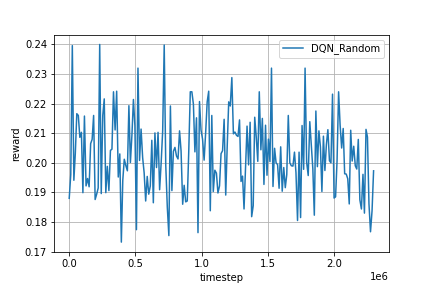

In [ ]:
Image(log_dir + '/rand_fig.png')

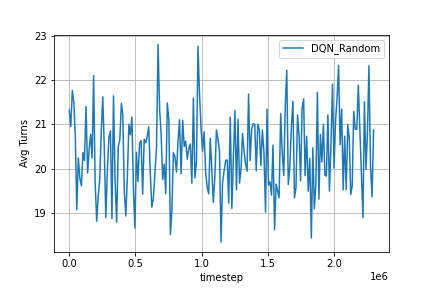

In [ ]:
Image(log_dir + '/rand_fig2.png')

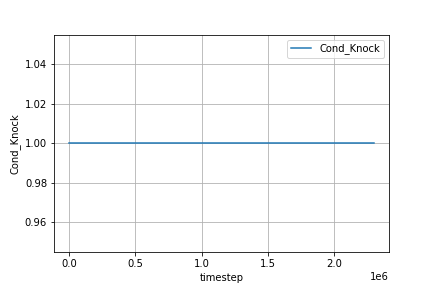

In [ ]:
Image(log_dir + '/rand_fig3.png')

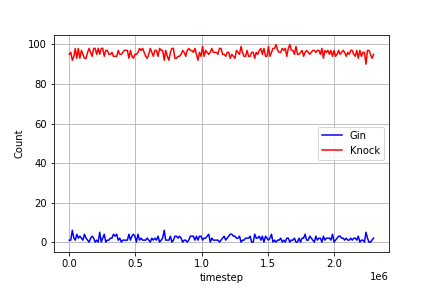

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 49, 'Other': 51, 'Knock_Possible': 49, 'Avg Turns': 15.44}


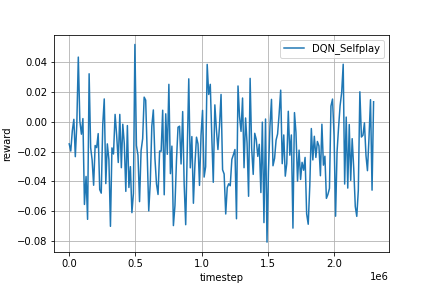

In [ ]:
Image(log_dir + '/self_fig.png')

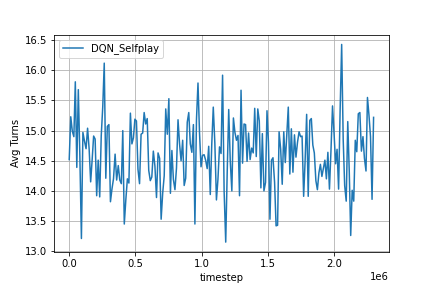

In [ ]:
Image(log_dir + '/self_fig2.png')

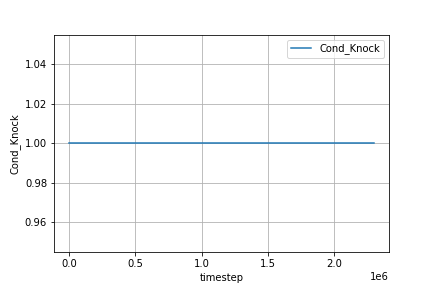

In [ ]:
Image(log_dir + '/self_fig3.png')

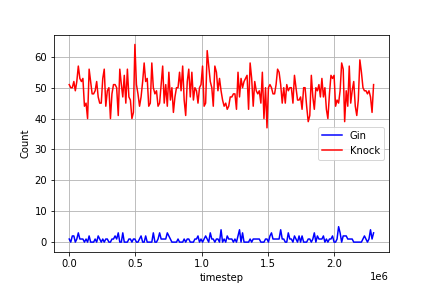

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 43, 'Other': 57, 'Knock_Possible': 43, 'Avg Turns': 14.89}


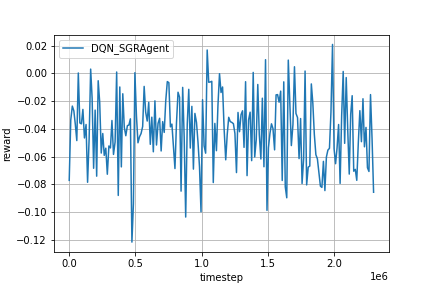

In [ ]:
Image(log_dir + '/sgr_fig.png')

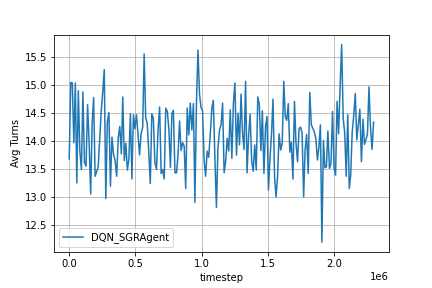

In [ ]:
Image(log_dir + '/sgr_fig2.png')

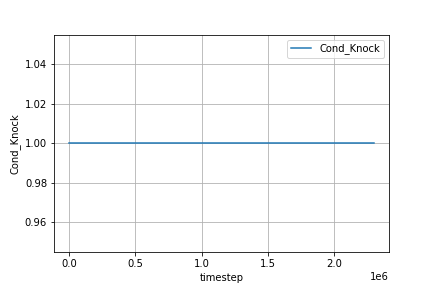

In [ ]:
Image(log_dir + '/sgr_fig3.png')

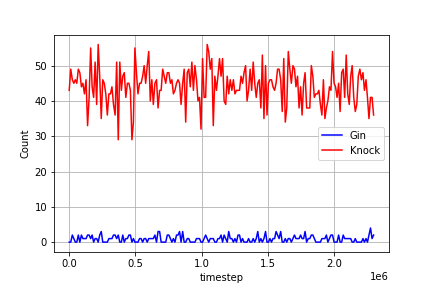

In [ ]:
Image(log_dir + '/sgr_fig4.png')

# Top Layer Testing on Selfplay - Payoffs

In [ ]:
dir = 'topLayer_self'    # root directory name for group of models

## base + payoff_v2

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base_payoffv2'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 2

# environment configs
payoff_fnc = get_payoff_gin_rummy_v2
cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.
  Gin: 6 | Knock: 92 | Other: 2
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  161197
  reward       |  0.12050000000000013
  Avg Turns    |  16.77
  Cond_Knock   |  0.6144578313253012
  Gin: 2 | Knock: 51 | Other: 47
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  161197
  reward       |  0.0406
  Avg Turns    |  15.33
  Cond_Knock   |  0.5492957746478874
  Gin: 2 | Knock: 39 | Other: 59
----------------------------------------
INFO - Agent dqn, step 82300, rl-loss: 0.051625579595565796
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  164788
  reward       |  0.40079999999999927
  Avg Turns    |  21.17
  Cond_Knock   |  0.5647058823529412
  Gin: 2 | Knock: 96 | Other: 2
----------------------------------------

Selfpla

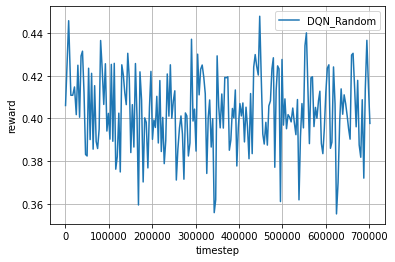

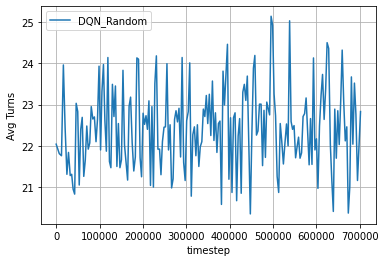

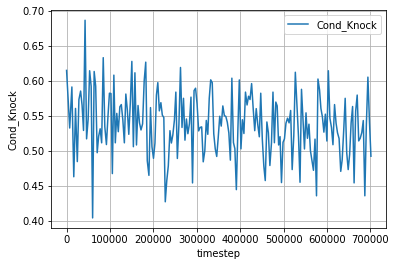

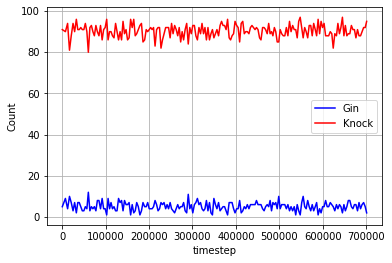

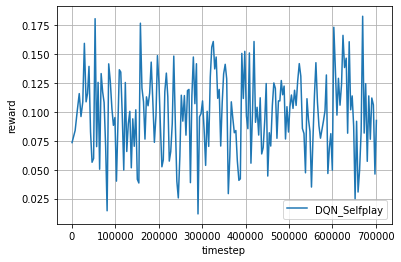

...

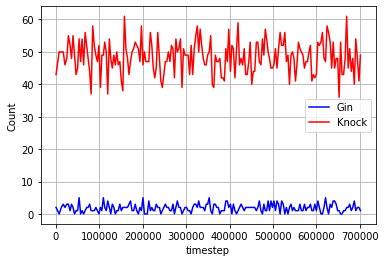

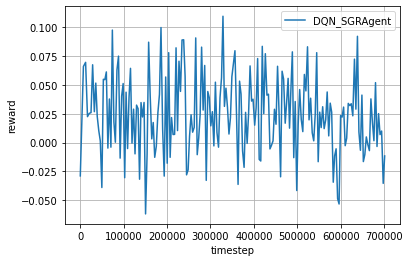

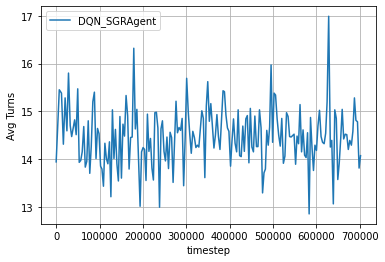

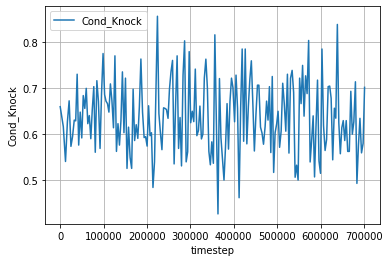

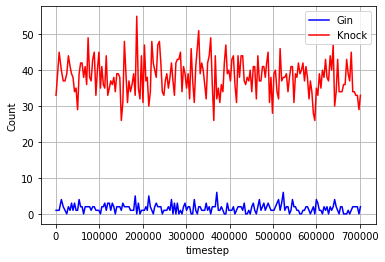

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 5, 'Knock': 89, 'Other': 6, 'Knock_Possible': 151, 'Avg Turns': 22.75}


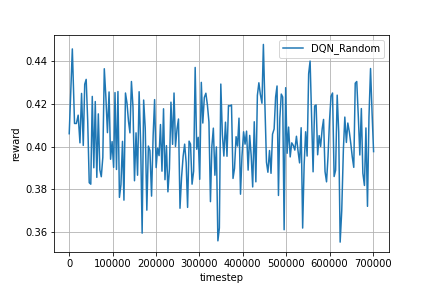

In [ ]:
Image(log_dir + '/rand_fig.png')

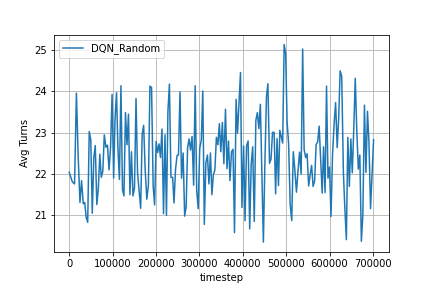

In [ ]:
Image(log_dir + '/rand_fig2.png')

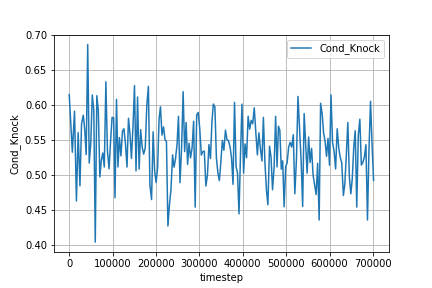

In [ ]:
Image(log_dir + '/rand_fig3.png')

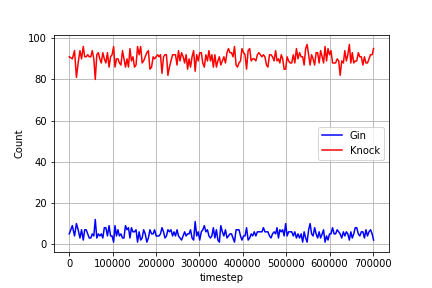

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 41, 'Other': 59, 'Knock_Possible': 75, 'Avg Turns': 15.99}


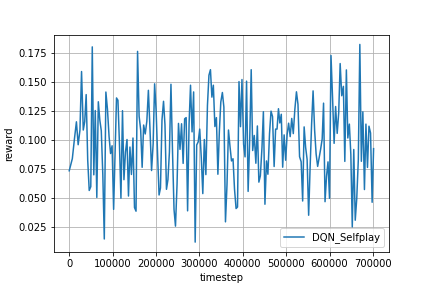

In [ ]:
Image(log_dir + '/self_fig.png')

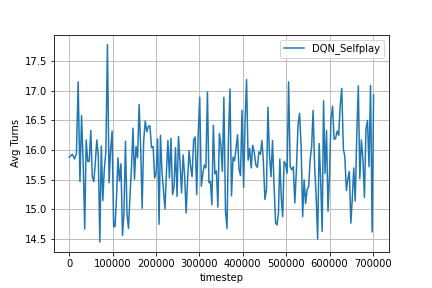

In [ ]:
Image(log_dir + '/self_fig2.png')

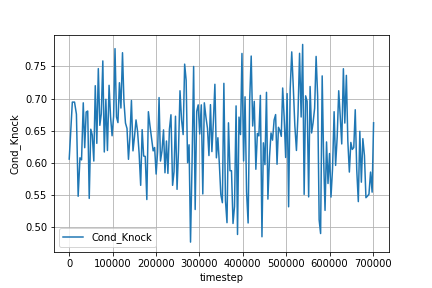

In [ ]:
Image(log_dir + '/self_fig3.png')

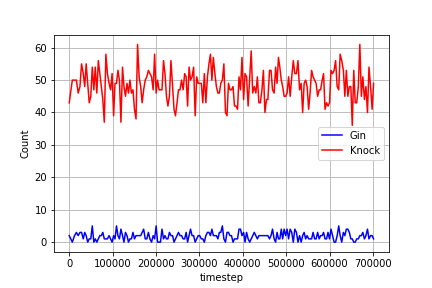

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 34, 'Other': 66, 'Knock_Possible': 60, 'Avg Turns': 15.47}


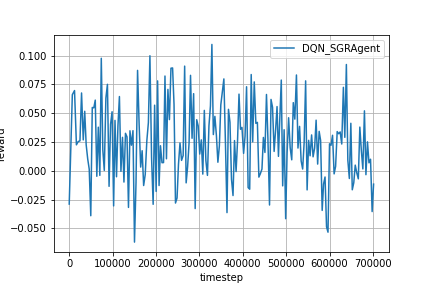

In [ ]:
Image(log_dir + '/sgr_fig.png')

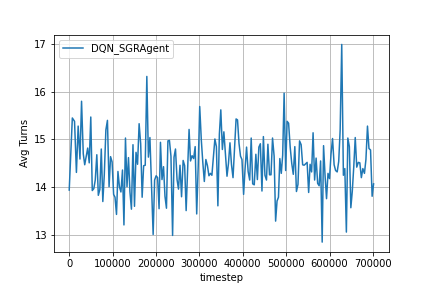

In [ ]:
Image(log_dir + '/sgr_fig2.png')

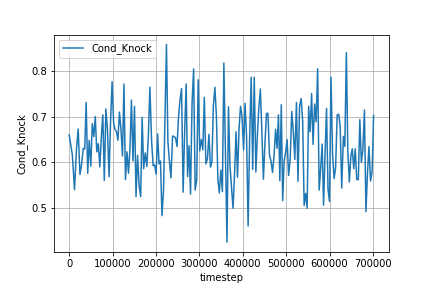

In [ ]:
Image(log_dir + '/sgr_fig3.png')

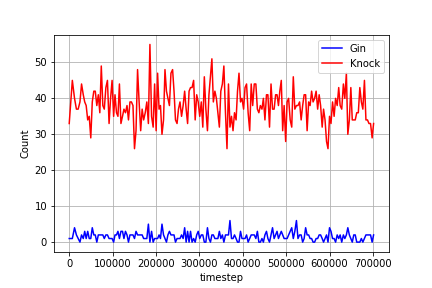

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## base + payoff_v3

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base_payoffv3'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 2

# environment configs
payoff_fnc = get_payoff_gin_rummy_v3
cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.
  Gin: 6 | Knock: 92 | Other: 2
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  161197
  reward       |  0.4264999999999998
  Avg Turns    |  16.77
  Cond_Knock   |  0.6144578313253012
  Gin: 2 | Knock: 51 | Other: 47
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  161197
  reward       |  0.27459999999999996
  Avg Turns    |  15.33
  Cond_Knock   |  0.5492957746478874
  Gin: 2 | Knock: 39 | Other: 59
----------------------------------------
INFO - Agent dqn, step 82300, rl-loss: 0.09098856151103973
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  164788
  reward       |  0.9768000000000001
  Avg Turns    |  21.17
  Cond_Knock   |  0.5647058823529412
  Gin: 2 | Knock: 96 | Other: 2
---------------------------------------

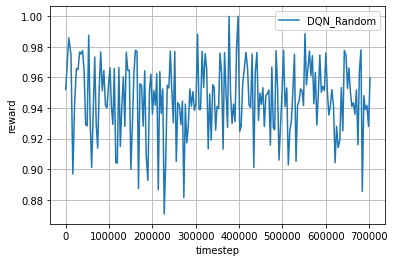

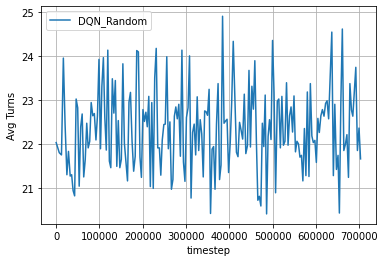

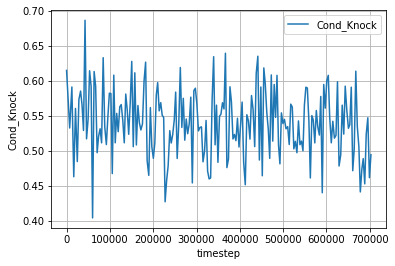

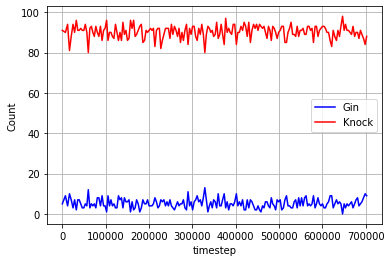

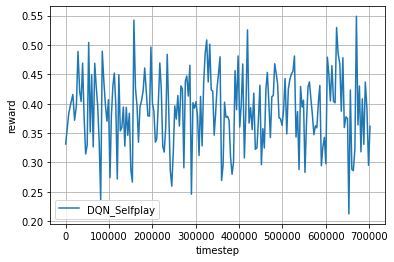

...

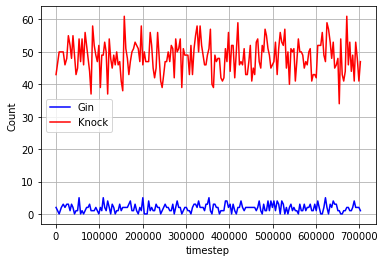

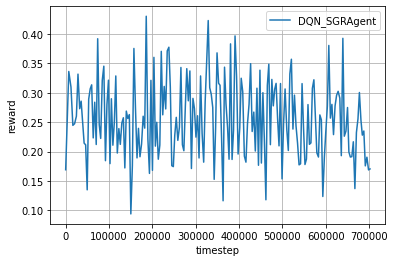

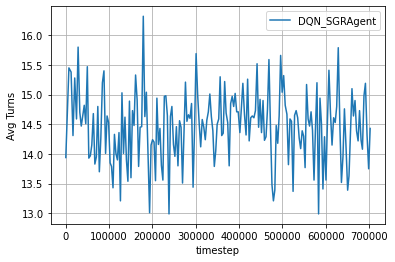

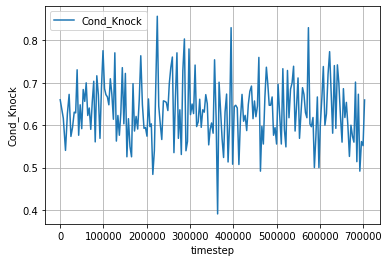

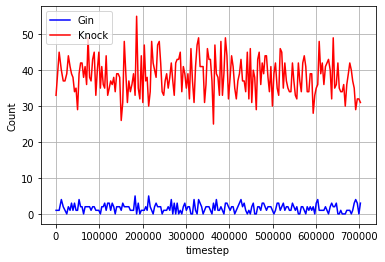

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 4, 'Knock': 91, 'Other': 5, 'Knock_Possible': 208, 'Avg Turns': 22.12}


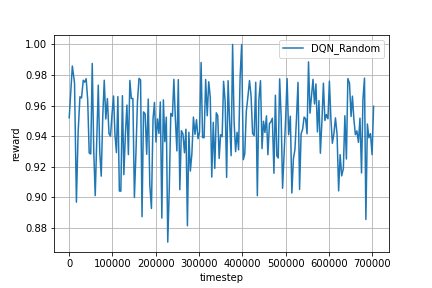

In [ ]:
Image(log_dir + '/rand_fig.png')

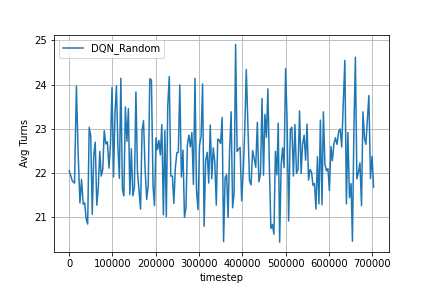

In [ ]:
Image(log_dir + '/rand_fig2.png')

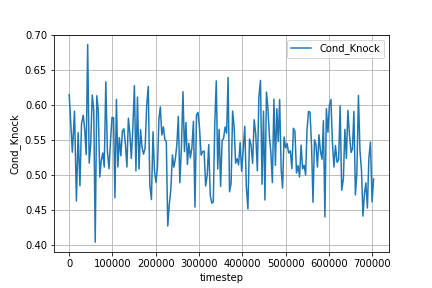

In [ ]:
Image(log_dir + '/rand_fig3.png')

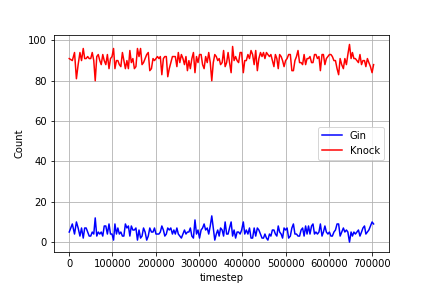

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 41, 'Other': 59, 'Knock_Possible': 73, 'Avg Turns': 15.91}


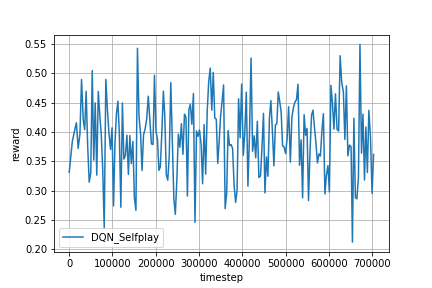

In [ ]:
Image(log_dir + '/self_fig.png')

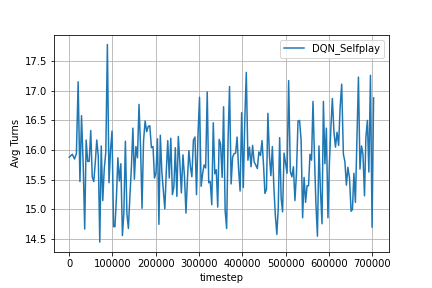

In [ ]:
Image(log_dir + '/self_fig2.png')

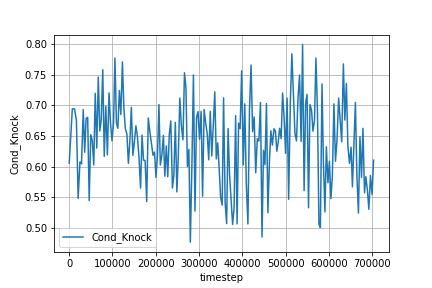

In [ ]:
Image(log_dir + '/self_fig3.png')

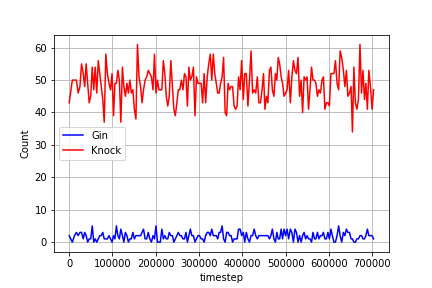

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 30, 'Other': 70, 'Knock_Possible': 55, 'Avg Turns': 15.71}


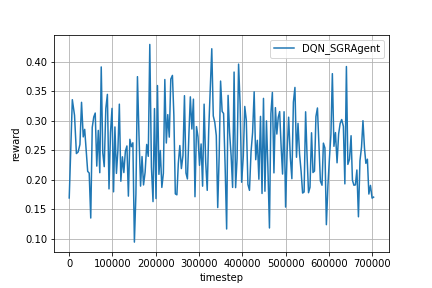

In [ ]:
Image(log_dir + '/sgr_fig.png')

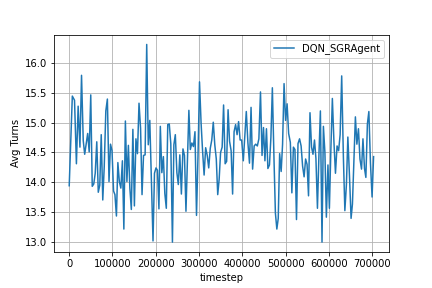

In [ ]:
Image(log_dir + '/sgr_fig2.png')

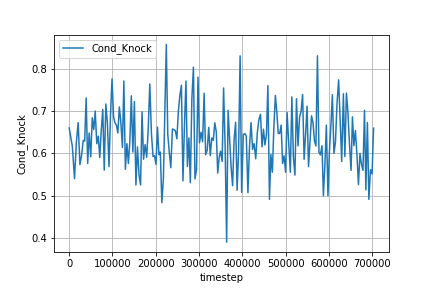

In [ ]:
Image(log_dir + '/sgr_fig3.png')

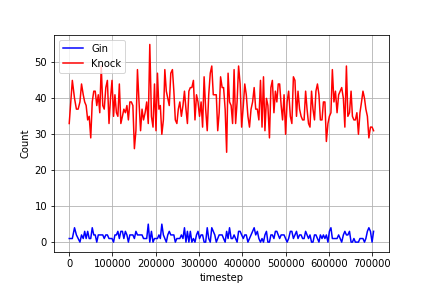

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## base + payoff_v4

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'base_payoffv4'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 100

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 2

# environment configs
payoff_fnc = get_payoff_gin_rummy_v4
cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, agent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint)

### Train

#### Training Loop

Streaming output truncated to the last 5000 lines.
  Gin: 6 | Knock: 92 | Other: 2
----------------------------------------

Selfplay:

----------------------------------------
  timestep     |  161197
  reward       |  5.0165
  Avg Turns    |  16.77
  Cond_Knock   |  0.6144578313253012
  Gin: 2 | Knock: 51 | Other: 47
----------------------------------------

SGRAgent:

----------------------------------------
  timestep     |  161197
  reward       |  3.7846
  Avg Turns    |  15.33
  Cond_Knock   |  0.5492957746478874
  Gin: 2 | Knock: 39 | Other: 59
----------------------------------------
INFO - Agent dqn, step 82500, rl-loss: 3.1763713359832764
----------------------------------------------------------------------

Random:

----------------------------------------
  timestep     |  165005
  reward       |  8.6596
  Avg Turns    |  22.31
  Cond_Knock   |  0.5375
  Gin: 7 | Knock: 86 | Other: 7
----------------------------------------

Selfplay:

------------------------------------

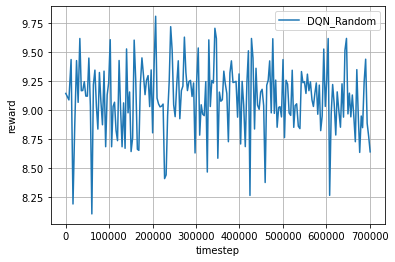

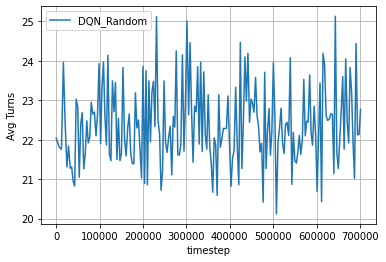

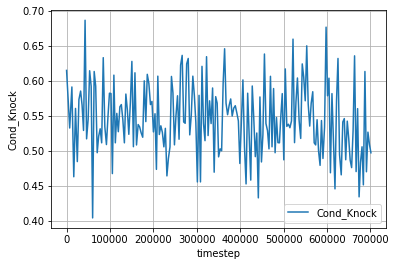

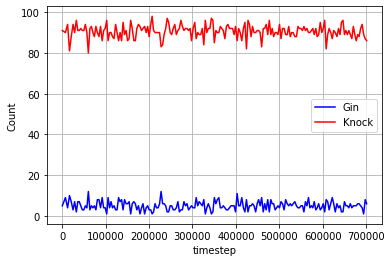

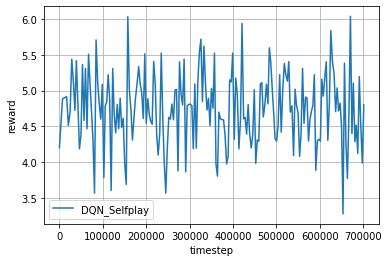

...

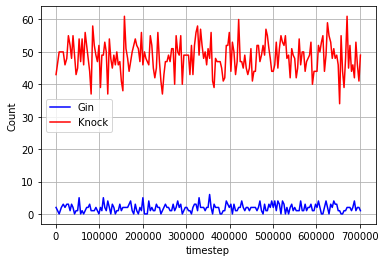

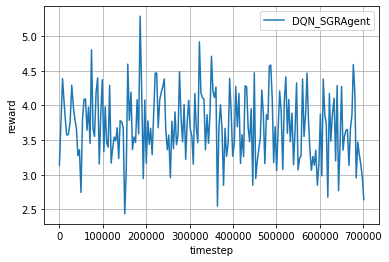

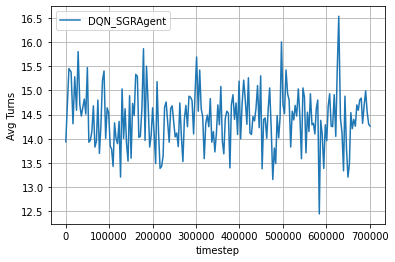

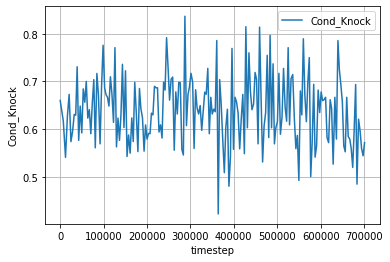

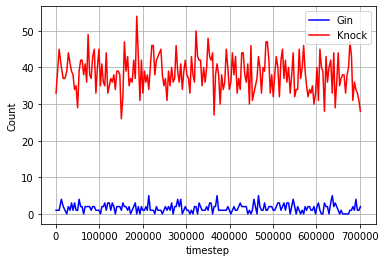

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 6, 'Knock': 87, 'Other': 7, 'Knock_Possible': 163, 'Avg Turns': 24.23}


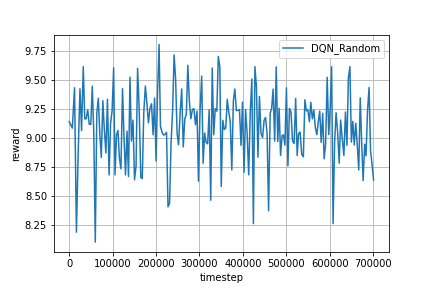

In [ ]:
Image(log_dir + '/rand_fig.png')

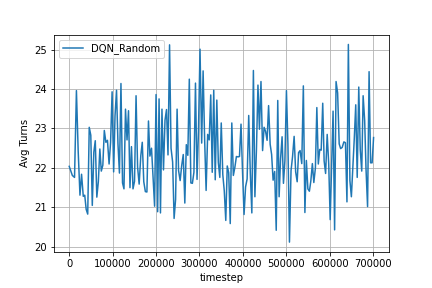

In [ ]:
Image(log_dir + '/rand_fig2.png')

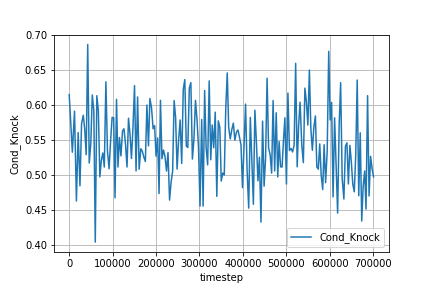

In [ ]:
Image(log_dir + '/rand_fig3.png')

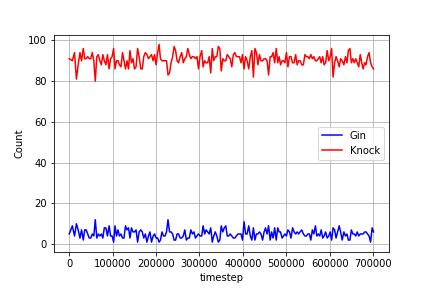

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 40, 'Other': 60, 'Knock_Possible': 73, 'Avg Turns': 16.01}


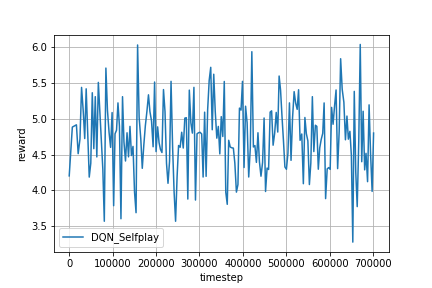

In [ ]:
Image(log_dir + '/self_fig.png')

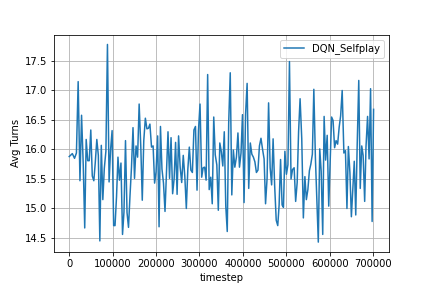

In [ ]:
Image(log_dir + '/self_fig2.png')

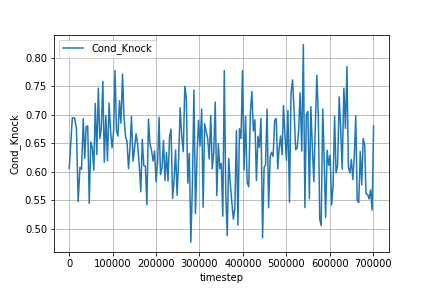

In [ ]:
Image(log_dir + '/self_fig3.png')

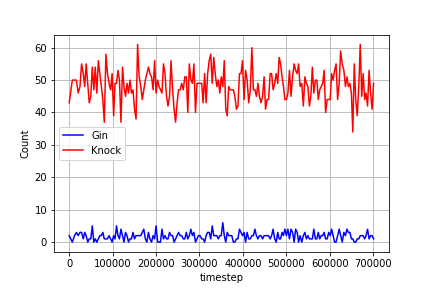

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 38, 'Other': 62, 'Knock_Possible': 63, 'Avg Turns': 15.58}


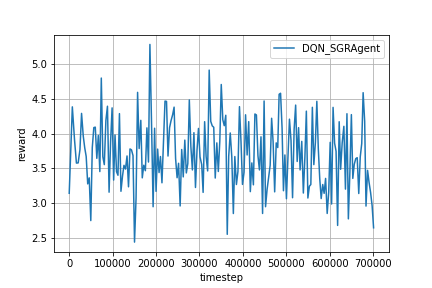

In [ ]:
Image(log_dir + '/sgr_fig.png')

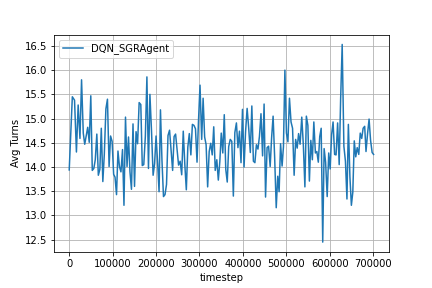

In [ ]:
Image(log_dir + '/sgr_fig2.png')

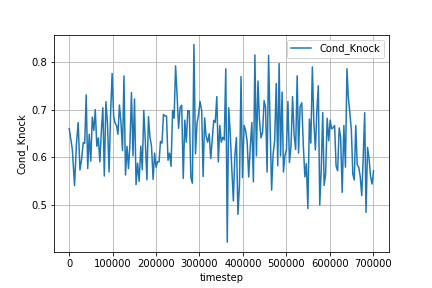

In [ ]:
Image(log_dir + '/sgr_fig3.png')

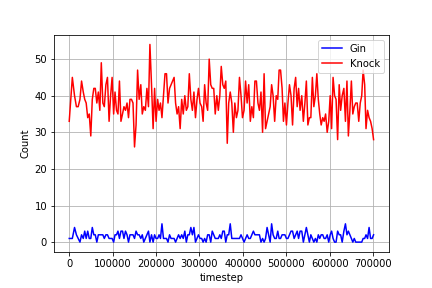

In [ ]:
Image(log_dir + '/sgr_fig4.png')

# Misc

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

## Plotting

In [ ]:
from rlcard.utils.logger import plot, plot_condknock,plot_actions
import os

# env_name = 'rand_'
# env_name = 'self_'
env_name = 'sgr_'
# algorithm = 'DQN_Random'
# algorithm = 'DQN_Selfplay'
algorithm = 'DQN_SGRAgent'
csv_path = os.path.join(log_dir, env_name + 'performance.csv') 
fig_path = os.path.join(log_dir, env_name + 'fig.png')
fig_path2 = os.path.join(log_dir, env_name + 'fig2.png')
fig_path3 = os.path.join(log_dir, env_name + 'fig3.png')
fig_path4 = os.path.join(log_dir, env_name + 'fig4.png')

plot(csv_path, fig_path, algorithm, ylabel='reward')
plot(csv_path, fig_path2, algorithm, ylabel='Avg Turns')
plot_condknock(csv_path, fig_path3)
plot_actions(csv_path, fig_path4)

## Weight Comparison

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
model_dqn_pre = torch.load('models/dqn/{}/{}/model_pretrain.pth'.format(dir,dqn_model_name), map_location='cpu')
model_dqn_post = torch.load('models/dqn/{}/{}/model_posttrain.pth'.format(dir,dqn_model_name), map_location='cpu')
model_q_estim_pre = model_dqn_pre['dqn_q_estimator']
model_q_estim_post = model_dqn_post['dqn_q_estimator']

In [ ]:
weights_q_estim_pre = model_q_estim_pre['fc_layers.5.weight'].flatten().tolist()
weights_q_estim_post = model_q_estim_post['fc_layers.5.weight'].flatten().tolist()

In [ ]:
dqn_model = 'Q Estimator'
weights_pre = weights_q_estim_pre
weights_post = weights_q_estim_post

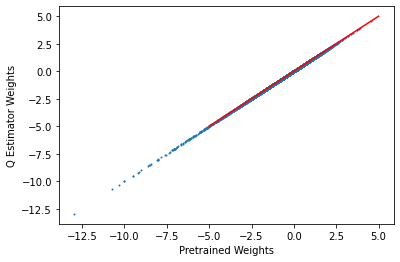

In [ ]:
# s = np.subtract(weights_post, weights_pre) + 1
fig = plt.figure()
plt.scatter(weights_pre, weights_post, s=1)
# plt.scatter(weights_pre, weights_post, s=s)
plt.xlabel('Pretrained Weights')
plt.ylabel('{} Weights'.format(dqn_model))
x = np.linspace(-5,5,100)
plt.plot(x, x, '-r')
plt.show()